In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

In [ ]:
import cv2
import numpy as np
from scipy import ndimage

In [ ]:
batch_size = 32
img_height = 180
img_width = 180

In [ ]:
import cv2
import tensorflow as tf
import matplotlib.pyplot as plt

In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  "/content/drive/MyDrive/Dataset/Train",
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  shuffle=True,
  batch_size = batch_size
)

Found 1298 files belonging to 2 classes.
Using 1039 files for training.


In [ ]:
class_names = train_ds.class_names
print(class_names)

['AI Generated', 'Captured']


In [ ]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 180, 180, 3)
(32,)


In [ ]:
type(train_ds)

tensorflow.python.data.ops.prefetch_op._PrefetchDataset

In [ ]:
def apply_laplacian_rgb(images):
    # Convert TensorFlow tensor to a NumPy array
    images = images.numpy()  # Shape will be (batch_size, img_height, img_width, 3)

    # Initialize an empty array to store the processed images
    laplacian_images = np.zeros(images.shape, dtype=np.uint8)  # Maintain the same shape

    for i in range(images.shape[0]):  # Iterate through each image in the batch
        # Convert each image from BGR to RGB
        image_rgb = cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB)

        # Apply Laplacian filter with kernel size = 17
        edges = cv2.Laplacian(image_rgb, cv2.CV_64F, ksize=17, scale=1, delta=0, borderType=cv2.BORDER_DEFAULT)


        # Store the processed image in the output array
        laplacian_images[i] = edges.astype(np.uint8)  # Convert back to uint8

    return laplacian_images  # Return the filtered batch of images

# TensorFlow wrapper for the Laplacian filter
def laplacian_preprocessing(images, labels):
    laplacian_images = tf.py_function(apply_laplacian_rgb, [images], tf.uint8)

    laplacian_images.set_shape([None, img_height, img_width, 3])

    return laplacian_images, labels

train_ds = train_ds.map(lambda x, y: laplacian_preprocessing(x, y))


<ipython-input-12-84be8a3c1335>:17: RuntimeWarning: invalid value encountered in cast
  laplacian_images[i] = edges.astype(np.uint8)  # Convert back to uint8


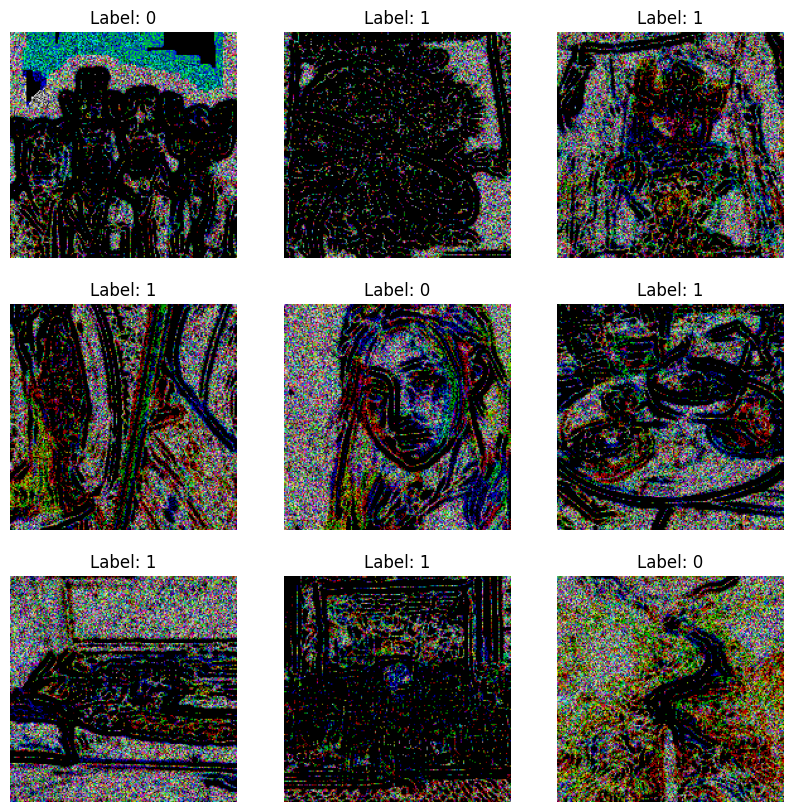

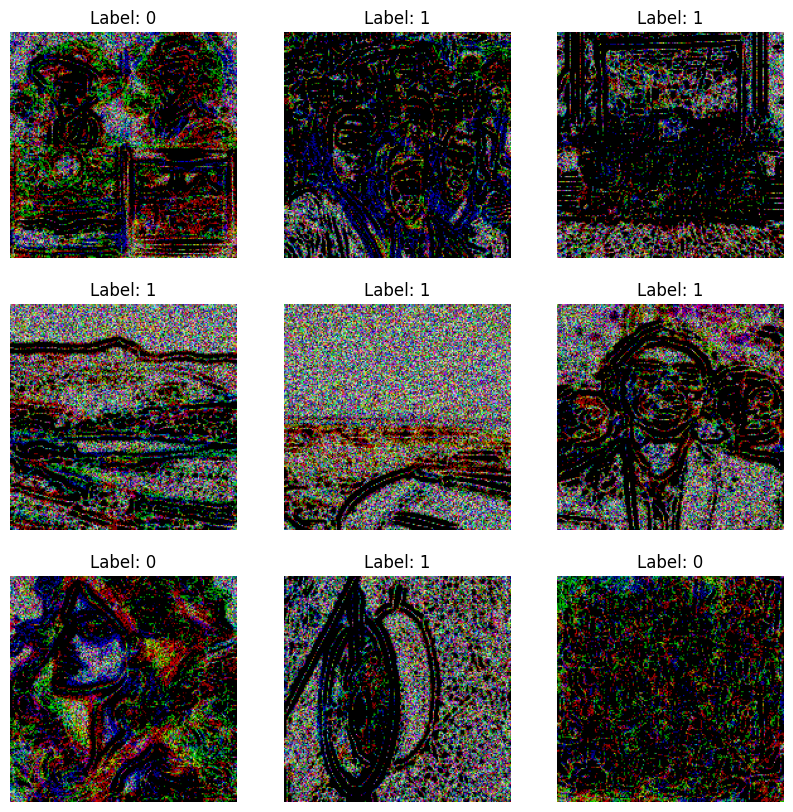

In [ ]:
for images, labels in train_ds.take(2):
    plt.figure(figsize=(10, 10))
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy())  # Convert to NumPy array for visualization
        plt.title(f"Label: {int(labels[i])}")
        plt.axis("off")
    plt.show()

In [ ]:
type(train_ds)

tensorflow.python.data.ops.map_op._MapDataset

In [ ]:
def high_pass_filter(image,label):

  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  edges = cv2.Laplacian(image, -1, ksize = 17,scale=1,delta=0,borderType=cv2.BORDER_DEFAULT)
  # output = [image, edges]
  # titles = ['Original', 'Edges']

  return edges,label

<ipython-input-12-84be8a3c1335>:17: RuntimeWarning: invalid value encountered in cast
  laplacian_images[i] = edges.astype(np.uint8)  # Convert back to uint8


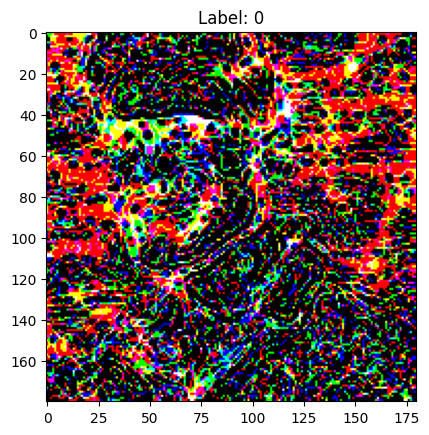

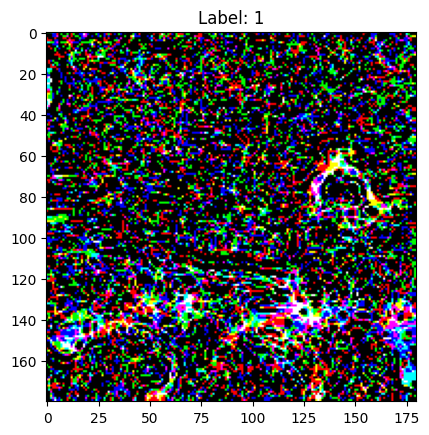

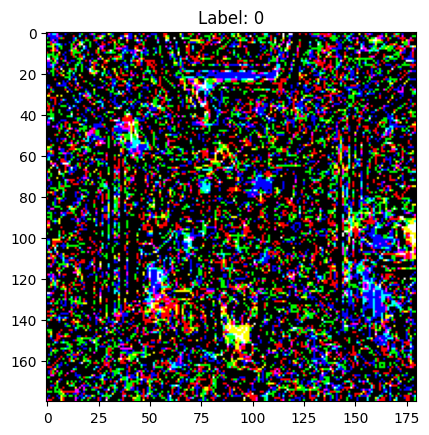

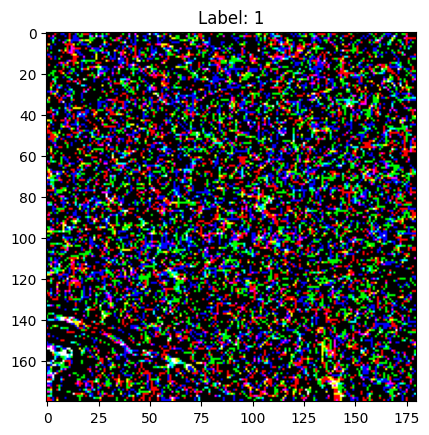

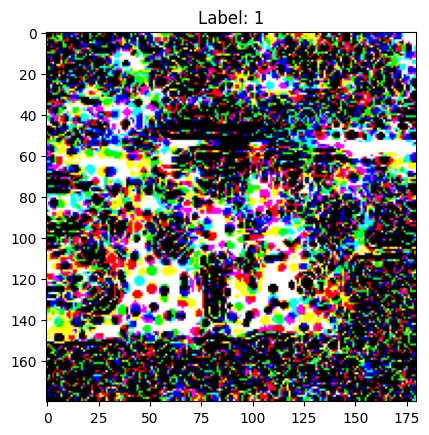

...

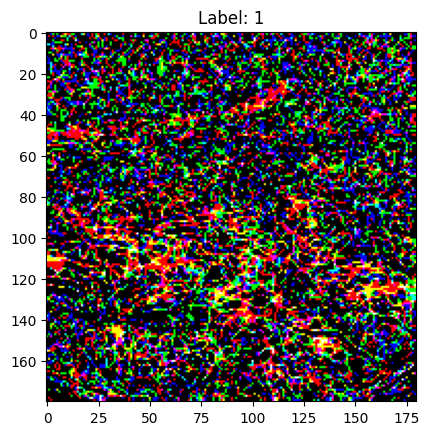

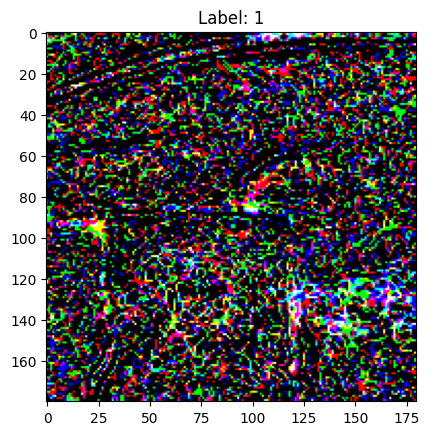

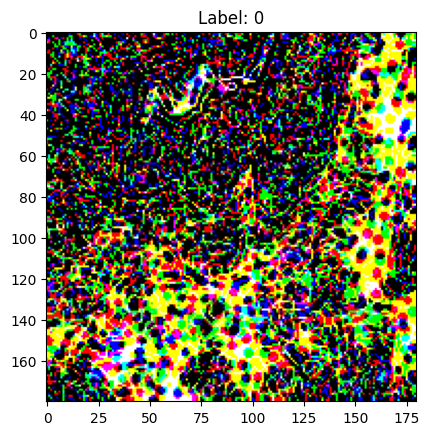

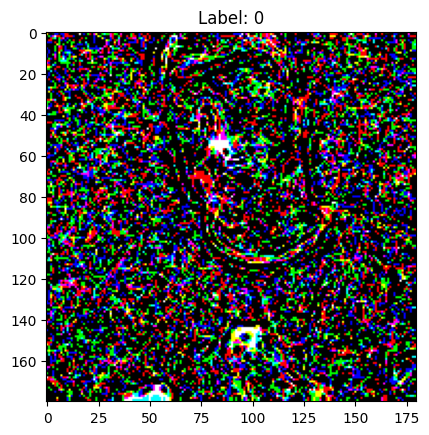

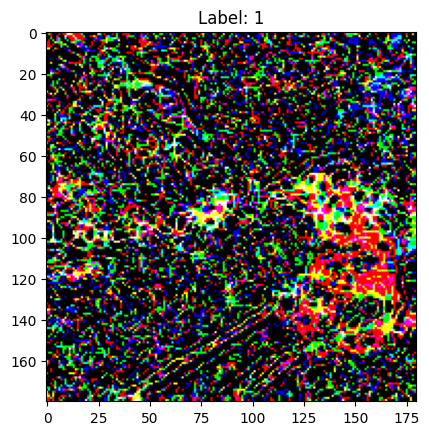

In [ ]:
import matplotlib.pyplot as plt

# Loop over the dataset batches
for images, labels in train_ds:

    for i in range(len(images)):
        image = images[i].numpy()  # Convert image to a numpy array for visualization
        label = labels[i].numpy()           # Get the corresponding label
        image,label = high_pass_filter(image, label)
        # Display the image
        plt.imshow(image.astype("uint8"))  # Cast to uint8 to visualize properly
        plt.title(f"Label: {label}")
        plt.show()
        # You can stop after showing a few images by using break
    break

<ipython-input-12-84be8a3c1335>:17: RuntimeWarning: invalid value encountered in cast
  laplacian_images[i] = edges.astype(np.uint8)  # Convert back to uint8


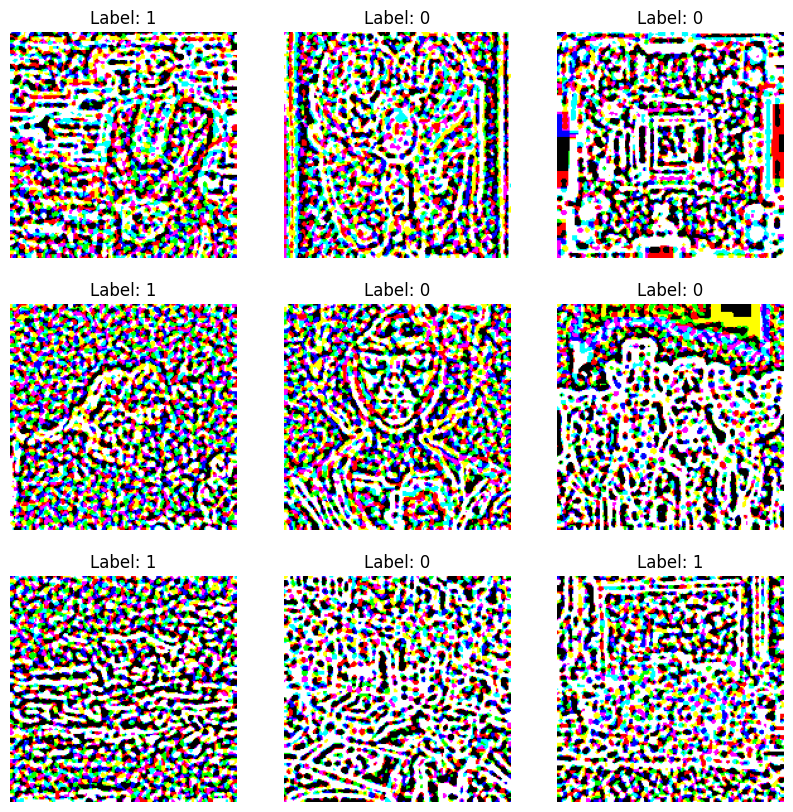

In [ ]:
import tensorflow as tf
import cv2
import matplotlib.pyplot as plt

def high_pass_filter(image):
    # Convert the image tensor to a NumPy array
    image = image.numpy()
    # Convert from BGR to RGB for correct color representation
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # Apply the Laplacian filter
    edges = cv2.Laplacian(image, cv2.CV_64F, ksize=17, scale=1, delta=0, borderType=cv2.BORDER_DEFAULT)
    return edges

def apply_filter_to_dataset(train_ds):
    filtered_images = []
    all_labels = []

    for images, labels in train_ds:  # Iterate over batches in the dataset
        for i in range(len(images)):
            filtered_image = high_pass_filter(images[i])  # Apply filter to each image
            filtered_images.append(filtered_image)  # Append filtered image
            all_labels.append(labels[i].numpy())  # Append corresponding label

    return filtered_images, all_labels  # Return the list of filtered images and labels

# Example usage:
# Assuming 'train_ds' is your training dataset
filtered_images, all_labels = apply_filter_to_dataset(train_ds)

# Visualize a few images to check the results
plt.figure(figsize=(10, 10))
for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(filtered_images[i])  # Show processed image
    plt.title(f"Label: {all_labels[i]}")
    plt.axis("off")
plt.show()


### **Working Model**


In [ ]:
import tensorflow as tf
import numpy as np
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import ParameterGrid
from sklearn.utils.class_weight import compute_class_weight
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns

# Image data parameters
batch_size = 32
img_height = 180
img_width = 180

# Load the training dataset with a validation split
train_ds = tf.keras.utils.image_dataset_from_directory(
    "/content/drive/MyDrive/Dataset/Train",
    validation_split=0.2,
    subset="training",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size,
    shuffle=True
)

val_ds = tf.keras.utils.image_dataset_from_directory(
    "/content/drive/MyDrive/Dataset/Train",
    validation_split=0.2,
    subset="validation",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size
)





Found 1298 files belonging to 2 classes.
Using 1039 files for training.
Found 1298 files belonging to 2 classes.
Using 259 files for validation.


In [ ]:
class_names = train_ds.class_names
print("Class names:", class_names)

# Handle Class Imbalance by computing class weights
train_labels = []
for images, labels in train_ds:
    train_labels.extend(labels.numpy())

class_weights = compute_class_weight('balanced', classes=np.unique(train_labels), y=train_labels)
class_weights_dict = {i: weight for i, weight in enumerate(class_weights)}
print(f"Class weights: {class_weights_dict}")

# Data Augmentation to increase diversity in the training set
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip('horizontal'),
    tf.keras.layers.RandomRotation(0.2),
])



Class names: ['AI Generated', 'Captured']
Class weights: {0: 1.0410821643286574, 1: 0.962037037037037}


In [ ]:
# Define the base EfficientNetB0 model
def create_model(learning_rate=0.001, dropout_rate=0.2):
    base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))
    x = base_model.output
    x = data_augmentation(x)  # Data augmentation layer
    x = GlobalAveragePooling2D()(x)  # Global average pooling
    x = Dropout(dropout_rate)(x)  # Add a dropout layer to prevent overfitting
    x = Dense(128, activation='relu')(x)  # Add a fully connected layer
    predictions = Dense(2, activation='softmax')(x)  # Output layer for binary classification

    # Compile the model
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
    return model



In [ ]:
# Hyperparameter Tuning
param_grid = {
    'learning_rate': [0.001, 0.0001],
    'dropout_rate': [0.2, 0.3],
    'epochs': [10,20],
}

best_accuracy = 0
best_params = None
best_model = None

for params in ParameterGrid(param_grid):
    print(f"Testing with params: {params}")

    # Create a model with current params
    model = create_model(learning_rate=params['learning_rate'], dropout_rate=params['dropout_rate'])

    # Early stopping to avoid overfitting
    early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

    # Train the model
    history = model.fit(train_ds, validation_data=val_ds,
                        epochs=params['epochs'],
                        class_weight=class_weights_dict,
                        callbacks=[early_stopping])

    # Get the best validation accuracy and update if the model performs better
    val_accuracy = max(history.history['val_accuracy'])
    if val_accuracy > best_accuracy:
        best_accuracy = val_accuracy
        best_params = params
        best_model = model


Testing with params: {'dropout_rate': 0.2, 'epochs': 10, 'learning_rate': 0.001}
16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 113s 2s/step - accuracy: 0.7642 - loss: 0.4728 - val_accuracy: 0.8340 - val_loss: 0.4651
Epoch 2/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 34s 1s/step - accuracy: 0.9320 - loss: 0.2047 - val_accuracy: 0.8417 - val_loss: 0.7825
Epoch 3/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - accuracy: 0.9803 - loss: 0.0682 - val_accuracy: 0.8803 - val_loss: 0.5426
Epoch 4/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 39s 970ms/step - accuracy: 0.9830 - loss: 0.0625 - val_accuracy: 0.8263 - val_loss: 0.9773
Testing with params: {'dropout_rate': 0.2, 'epochs': 10, 'learning_rate': 0.0001}
Epoch 1/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 75s 1s/step - accuracy: 0.6646 - loss: 0.6112 - val_accuracy: 0.7529 - val_loss: 0.4938
Epoch 2/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 33s 995ms/step - accuracy: 0.8940 - loss: 0.2907 - val_accuracy: 0.8108 - val_loss: 0.4032
Epoch 3/10
33/33 ━━━━━━

Best params: {'dropout_rate': 0.2, 'epochs': 20, 'learning_rate': 0.0001}
Best validation accuracy: 0.9111968874931335


<ipython-input-12-84be8a3c1335>:17: RuntimeWarning: invalid value encountered in cast
  laplacian_images[i] = edges.astype(np.uint8)  # Convert back to uint8


1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━

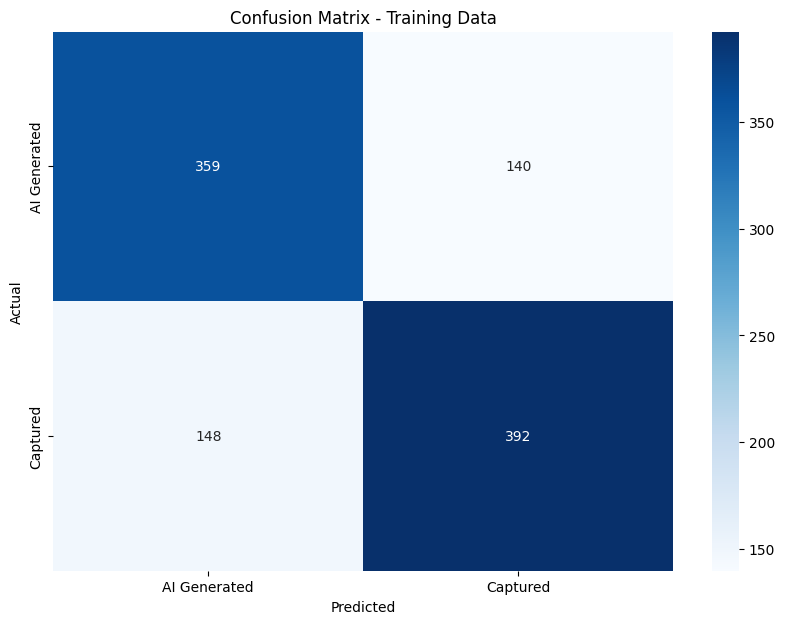

Classification Report - Training Data:
              precision    recall  f1-score   support

AI Generated       0.71      0.72      0.71       499
    Captured       0.74      0.73      0.73       540

    accuracy                           0.72      1039
   macro avg       0.72      0.72      0.72      1039
weighted avg       0.72      0.72      0.72      1039



In [ ]:
# Output the best hyperparameters
print(f"Best params: {best_params}")
print(f"Best validation accuracy: {best_accuracy}")

# Evaluate the model on the training set
train_labels_true = []
train_labels_pred = []

for images, labels in train_ds:
    train_labels_true.extend(labels.numpy())
    predictions = best_model.predict(images)
    train_labels_pred.extend(np.argmax(predictions, axis=1))

# Confusion Matrix for Training Data
conf_matrix_train = confusion_matrix(train_labels_true, train_labels_pred)

# Plotting Confusion Matrix
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix_train, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix - Training Data')
plt.show()

# Classification Report for Training Data
print("Classification Report - Training Data:")
print(classification_report(train_labels_true, train_labels_pred, target_names=class_names))

In [ ]:
import numpy as np
from sklearn.metrics import classification_report

# Assuming your training dataset is train_ds and your trained model is 'model'

# Initialize lists to hold true labels and predicted labels for training data
train_labels_true = []
train_labels_pred = []

# Iterate over the training dataset to collect true and predicted labels
for images, labels in train_ds:
    train_labels_true.extend(labels.numpy())  # Collect true labels
    predictions = model.predict(images)  # Get model predictions
    train_labels_pred.extend(np.argmax(predictions, axis=1))  # Collect predicted labels

# Convert lists to numpy arrays
train_labels_true = np.array(train_labels_true)
train_labels_pred = np.array(train_labels_pred)

# Print classification report for training data
print("Classification Report - Training Data:")
print(classification_report(train_labels_true, train_labels_pred, target_names=class_names))


<ipython-input-12-84be8a3c1335>:17: RuntimeWarning: invalid value encountered in cast
  laplacian_images[i] = edges.astype(np.uint8)  # Convert back to uint8


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━

### **Evolution**

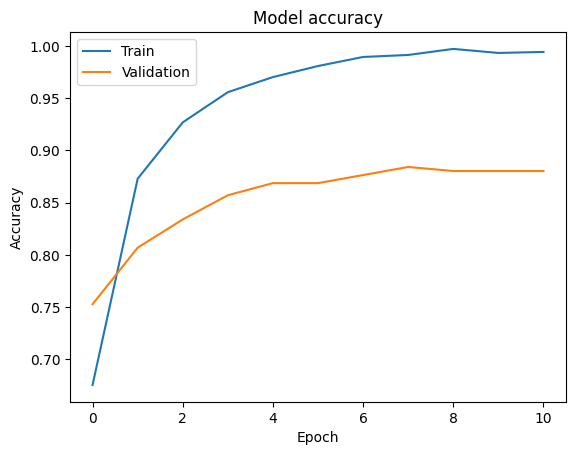

In [ ]:
# Access the training history
# history = model.fit(train_ds, validation_data=val_ds, epochs=10)

# Plot training & validation accuracy values
import matplotlib.pyplot as plt

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


In [ ]:
# Evaluate the model on the validation dataset
val_loss, val_accuracy = model.evaluate(val_ds)

# Print the validation accuracy
print(f"Validation Accuracy: {val_accuracy * 100:.2f}%")


9/9 ━━━━━━━━━━━━━━━━━━━━ 5s 572ms/step - accuracy: 0.8847 - loss: 0.2910
Validation Accuracy: 88.42%


In [ ]:
model.summary()

Model: "functional_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8             │ (None, 180, 180, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_14 (Rescaling)  │ (None, 180, 180, 3)    │              0 │ input_layer_8[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ normalization_7           │ (None, 180, 180, 3)    │              7 │ rescaling_14[0][0]     │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_15 (Rescaling)  │ (None, 180, 180, 3)    │              0 │ normalization_7[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv_pad             │ (None, 181, 181, 3)    │              0 │ rescaling_15[0][0]     │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, 90, 90, 32)     │            864 │ stem_conv_pad[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, 90, 90, 32)     │            128 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, 90, 90, 32)     │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_dwconv            │ (None, 90, 90, 32)     │            288 │ stem_activation[0][0]  │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_bn                │ (None, 90, 90, 32)     │            128 │ block1a_dwconv[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_activation        │ (None, 90, 90, 32)     │              0 │ block1a_bn[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_squeeze        │ (None, 32)             │              0 │ block1a_activation[0]… │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reshape        │ (None, 1, 1, 32)       │              0 │ block1a_se_squeeze[0]… │
│ (Reshape)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reduce         │ (None, 1, 1, 8)        │            264 │ block1a_se_reshape[0]… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 12,557,347 (47.90 MB)

 Trainable params: 4,171,774 (15.91 MB)

 Non-trainable params: 42,023 (164.16 KB)

 Optimizer params: 8,343,550 (31.83 MB)

### **Testing**


In [ ]:
# Load the test dataset (without validation split)
test_ds = tf.keras.utils.image_dataset_from_directory(
  "/content/drive/MyDrive/Dataset/Test",  # Path to your test dataset
  image_size=(img_height, img_width),
  batch_size=batch_size,
  shuffle=False  # No need to shuffle for testing
)

# Apply preprocessing (e.g., high-pass filtering) to the test dataset
test_ds = test_ds.map(lambda x, y: laplacian_preprocessing(x, y))


Found 320 files belonging to 2 classes.


In [ ]:
# Evaluate the model on the test dataset
test_loss, test_accuracy = model.evaluate(test_ds)
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")


 1/10 ━━━━━━━━━━━━━━━━━━━━ 1:04 7s/step - accuracy: 0.6875 - loss: 0.6860

<ipython-input-12-84be8a3c1335>:17: RuntimeWarning: invalid value encountered in cast
  laplacian_images[i] = edges.astype(np.uint8)  # Convert back to uint8


10/10 ━━━━━━━━━━━━━━━━━━━━ 66s 7s/step - accuracy: 0.7186 - loss: 0.5857
Test Loss: 0.4729449152946472
Test Accuracy: 0.78125


In [ ]:
# Load the training dataset and save class names before preprocessing
train_ds = tf.keras.utils.image_dataset_from_directory(
  "/content/drive/MyDrive/Dataset/Train",
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size,
  shuffle=True
)

# Capture class names before applying preprocessing
class_names = train_ds.class_names
print(class_names)

# Apply preprocessing
train_ds = train_ds.map(lambda x, y: laplacian_preprocessing(x, y))

# Apply preprocessing to validation and test datasets as well
val_ds = tf.keras.utils.image_dataset_from_directory(
  "/content/drive/MyDrive/Dataset/Train",
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size,
  shuffle=True
)
val_ds = val_ds.map(lambda x, y: laplacian_preprocessing(x, y))

test_ds = tf.keras.utils.image_dataset_from_directory(
  "/content/drive/MyDrive/Dataset/Test",
  image_size=(img_height, img_width),
  batch_size=batch_size,
  shuffle=False
)
test_ds = test_ds.map(lambda x, y: laplacian_preprocessing(x, y))


Found 1298 files belonging to 2 classes.
Using 1039 files for training.
['AI Generated', 'Captured']
Found 1298 files belonging to 2 classes.
Using 259 files for validation.
Found 320 files belonging to 2 classes.


<ipython-input-12-84be8a3c1335>:17: RuntimeWarning: invalid value encountered in cast
  laplacian_images[i] = edges.astype(np.uint8)  # Convert back to uint8


10/10 ━━━━━━━━━━━━━━━━━━━━ 8s 481ms/step


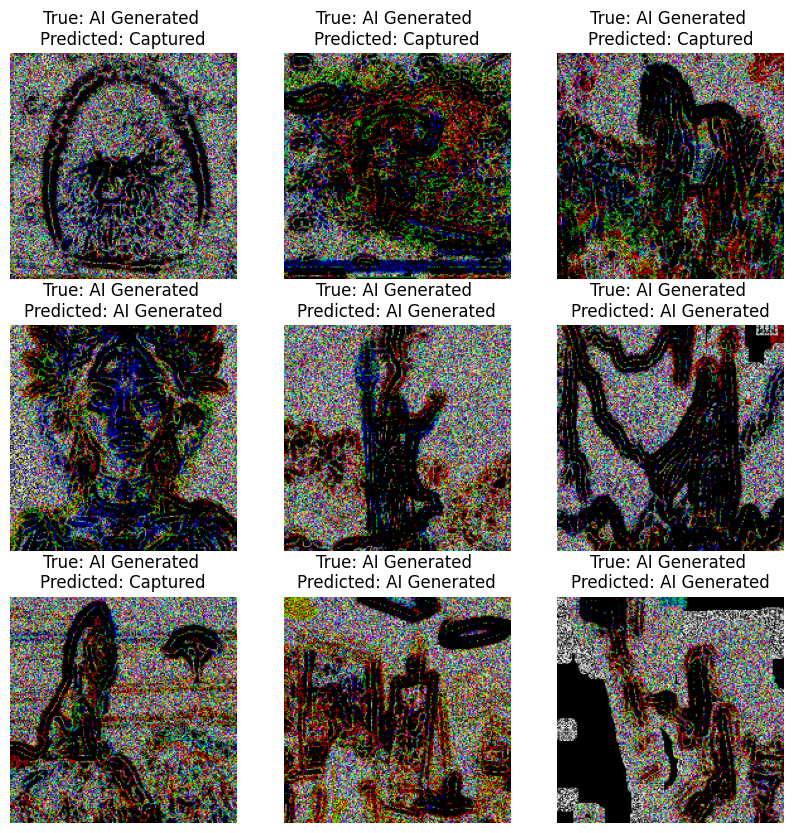

In [ ]:
# Make predictions on the test dataset
predictions = model.predict(test_ds)

# Extract predicted labels from the model output
pred_labels = np.argmax(predictions, axis=1)

# Display a few images along with their true and predicted labels
import matplotlib.pyplot as plt

for images, labels in test_ds.take(1):  # Take one batch from the test set
    plt.figure(figsize=(10, 10))
    for i in range(9):  # Display 9 sample images with predictions
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(f"True: {class_names[int(labels[i])]} \nPredicted: {class_names[pred_labels[i]]}")
        plt.axis("off")
    plt.show()


<ipython-input-12-84be8a3c1335>:17: RuntimeWarning: invalid value encountered in cast
  laplacian_images[i] = edges.astype(np.uint8)  # Convert back to uint8


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


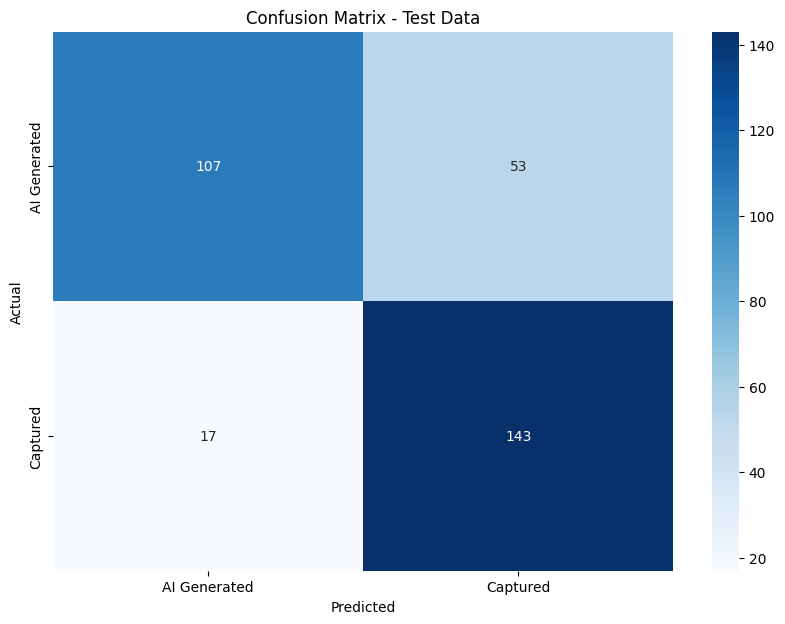

Classification Report - Test Data:
              precision    recall  f1-score   support

AI Generated       0.86      0.67      0.75       160
    Captured       0.73      0.89      0.80       160

    accuracy                           0.78       320
   macro avg       0.80      0.78      0.78       320
weighted avg       0.80      0.78      0.78       320



In [ ]:
test_labels_true = []
test_labels_pred = []

# Iterate over the test dataset to collect true and predicted labels
for images, labels in test_ds:
    test_labels_true.extend(labels.numpy())  # Collect true labels
    predictions = model.predict(images)  # Get model predictions
    test_labels_pred.extend(np.argmax(predictions, axis=1))  # Collect predicted labels

# Convert lists to numpy arrays
test_labels_true = np.array(test_labels_true)
test_labels_pred = np.array(test_labels_pred)

# Compute confusion matrix
conf_matrix_test = confusion_matrix(test_labels_true, test_labels_pred)

# Plotting the Confusion Matrix
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix_test, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix - Test Data')
plt.show()

# Print classification report for test data
print("Classification Report - Test Data:")
print(classification_report(test_labels_true, test_labels_pred, target_names=class_names))

In [ ]:
import tensorflow as tf
import numpy as np
import cv2

# Load and preprocess a new image
def load_and_preprocess_image(image_path):
    # Load the image and resize it
    img = tf.keras.preprocessing.image.load_img(image_path, target_size=(img_height, img_width))

    # Convert the image to an array
    img_array = tf.keras.preprocessing.image.img_to_array(img)

    # Apply the same preprocessing (e.g., high-pass filtering)
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    img_array = laplacian_preprocessing(img_array, None)[0]  # Apply preprocessing

    return img_array

# Example usage:
image_path = "/content/Screenshot 2024-10-18 205008.png"  # Replace with the path to your new image
preprocessed_img = load_and_preprocess_image(image_path)


<ipython-input-12-84be8a3c1335>:17: RuntimeWarning: invalid value encountered in cast
  laplacian_images[i] = edges.astype(np.uint8)  # Convert back to uint8


In [ ]:
# Make prediction for the new image
prediction = model.predict(preprocessed_img)

# Get the predicted label
predicted_label = np.argmax(prediction, axis=1)

# Print the predicted class name
print(f"Predicted class: {class_names[predicted_label[0]]}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
Predicted class: AI Generated


In [ ]:
import pickle

with open("/content/drive/MyDrive/myrushiefficientmodel3.pkl","wb") as f:
  pickle.dump(model, f)


